## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy
import scipy.sparse.linalg
import utils

# # modify to where you store your project data including utils.py
# datadir = "/content/drive/My Drive/cs445_projects/proj3/" 

# utilfn = datadir + "utils.py"
# !cp "$utilfn" .
# samplesfn = datadir + "samples"
# !cp -r "$samplesfn" .
# import utils

## Part 1 Toy Problem (20 pts)

In [ ]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    im_h, im_w = img.shape
    num_pixels = im_h * im_w
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)

    A = scipy.sparse.lil_matrix((num_pixels*2 + 1, num_pixels), dtype='double') # init lil
    b = np.zeros((num_pixels*2+1,1), dtype='double')
    ### [ code to fill values here ]
    e = 0
    for x in range(im_w - 1):  # Looping over width, avoiding last column
        for y in range(im_h):  # Loop over all rows
            A[e, im2var[y, x+1]] = 1
            A[e, im2var[y, x]] = -1
            b[e] = img[y, x+1] - img[y, x]
            e += 1

    for x in range(im_w):  # Loop over all columns
        for y in range(im_h - 1):  # Looping over height, avoiding last row
            A[e, im2var[y+1, x]] = 1
            A[e, im2var[y, x]] = -1
            b[e] = img[y+1, x] - img[y, x]
            e += 1
    A[e,im2var[0][0]] = 1
    b[e] = img[0][0]
    A = A.tocsr()

    v = scipy.sparse.linalg.lsqr(A, b)[0]
    # print(v)
    return v.reshape(im_h, im_w)




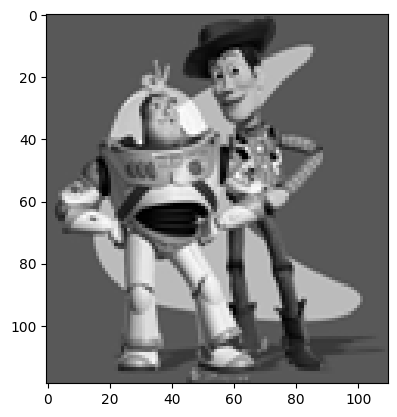

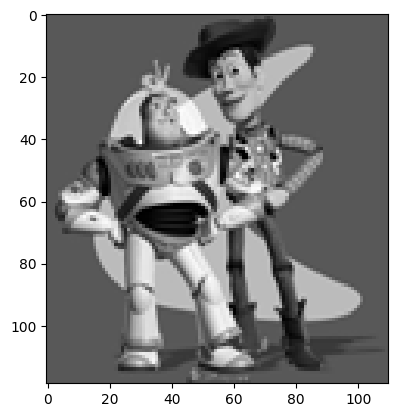

Max error is:  0.0010002051356804986


In [149]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")
plt.show()

im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

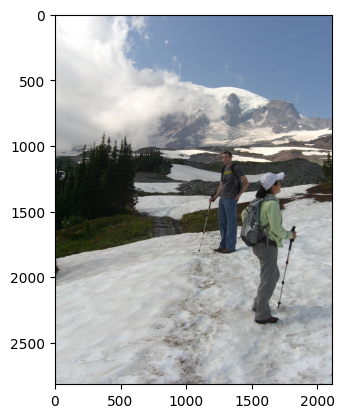

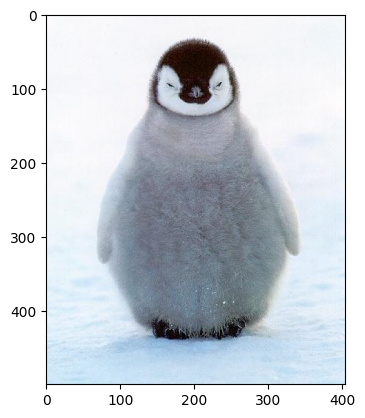

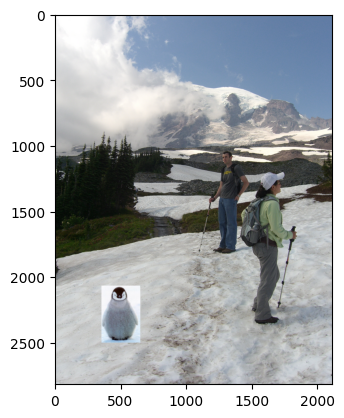

In [109]:
background_img = cv2.cvtColor(cv2.imread('samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (500, 2500) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



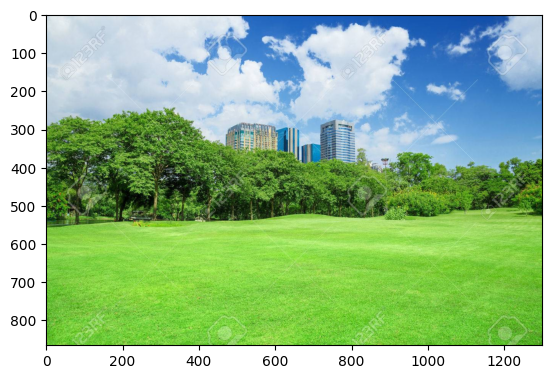

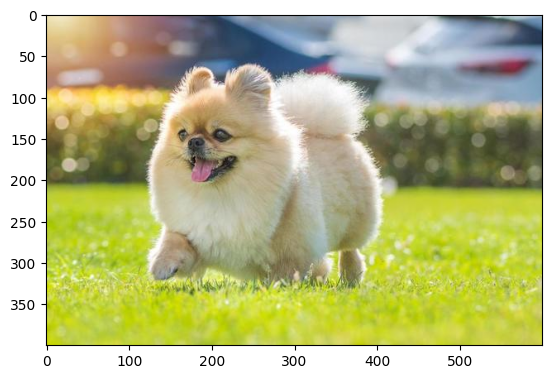

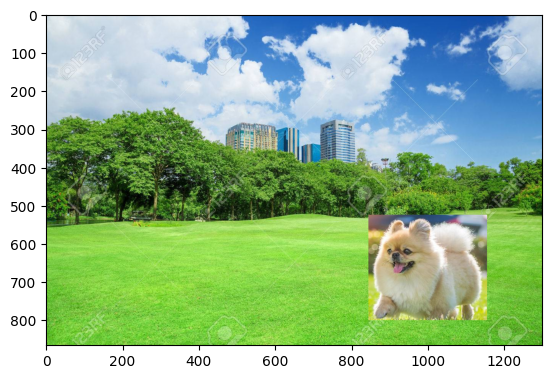

In [220]:
background_img = cv2.cvtColor(cv2.imread('samples/grass.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/puppy.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  # xs = (65, 359, 359, 65)
  # ys = (24, 24, 457, 457)
  xs = (110, 420, 420, 110)
  ys = (50, 50, 325, 325)
  
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (1000, 800) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



In [ ]:
if use_interface:
  import matplotlib.pyplot as plt
  %matplotlib notebook
  mask_coords = utils.specify_mask(object_img)

In [ ]:
if use_interface:
  xs = mask_coords[0]
  ys = mask_coords[1]
  %matplotlib inline
  import matplotlib.pyplot as plt
  plt.figure()
  object_mask = get_mask(ys, xs, object_img)

In [ ]:
if use_interface:
  %matplotlib notebook
  import matplotlib.pyplot as plt
  bottom_center = specify_bottom_center(background_img)
  %matplotlib inline
  import matplotlib.pyplot as plt

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



## Part 2 Poisson Blending (50 pts)

In [6]:
# def poisson_blend(object_img, object_mask, bg_img, bg_ul):
#     """
#     Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
#     Can be implemented to operate on a single channel or multiple channels
#     :param object_img: the image containing the foreground object
#     :param object_mask: the mask of the foreground object in object_img
#     :param background_img: the background image 
#     :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
#     """
#     #TO DO 
def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    im_h, im_w = object_img.shape
    bg_h, bg_w = bg_img.shape
    result = bg_img.copy()


    num_pixels = im_h * im_w
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    A = scipy.sparse.lil_matrix((num_pixels*8, num_pixels), dtype='double')
    b = np.zeros((num_pixels*8, 1), dtype='double')
    e = 0
    for x in range(im_w):
        for y in range(im_h):
            # Ensure we stay within bounds when accessing neighboring pixels
            if x < im_w - 1:  # x+1 boundary check
                A[e, im2var[y, x]] = 1
                A[e, im2var[y, x+1]] = -1
                b[e] = object_img[y, x] - object_img[y, x+1]
                e += 1
            # if x > 0:  # x-1 boundary check
            #     A[e, im2var[y, x]] = 1
            #     A[e, im2var[y, x-1]] = -1
            #     b[e] = object_img[y, x] - object_img[y, x-1]
            #     e += 1

            if y < im_h - 1:  # y+1 boundary check
                A[e, im2var[y, x]] = 1
                A[e, im2var[y+1, x]] = -1
                b[e] = object_img[y, x] - object_img[y+1, x]
                e += 1

            # if y > 0:  # y-1 boundary check
            #     A[e, im2var[y, x]] = 1
            #     A[e, im2var[y-1, x]] = -1
            #     b[e] = object_img[y, x] - object_img[y-1, x]
            #     e += 1
            
            if (x == 0):
                A[e, im2var[y, x+1]] = 1
                b[e] = object_img[y, x+1] - object_img[y, x] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1

            if (x == im_w-1):
                A[e, im2var[y, x-1]] = 1
                b[e] = object_img[y, x] - object_img[y, x-1] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1

            if (y == 0):
                A[e, im2var[y+1, x]] = 1
                b[e] = object_img[y+1, x] - object_img[y, x] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1

            if (y == im_h-1):
                A[e, im2var[y-1, x]] = 1
                b[e] = object_img[y-1, x] - object_img[y, x] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1


            # # Background blending: Ensure background image is within bounds
            # if x < im_w - 1:# and (bg_ul[0] + y < bg_img.shape[0]) and (bg_ul[1] + x + 1 < bg_img.shape[1]):  # x+1 boundary check for background
            #     A[e, im2var[y, x]] = 1
            #     b[e] = object_img[y, x] - object_img[y, x+1] + bg_img[bg_ul[0] + y, bg_ul[1] + x + 1]
            #     e += 1

            # if x > 0:# and (bg_ul[0] + y < bg_img.shape[0]) and (bg_ul[1] + x - 1 >= 0):  # x-1 boundary check for background
            #     A[e, im2var[y, x]] = 1
            #     b[e] = object_img[y, x] - object_img[y, x-1] + bg_img[bg_ul[0] + y, bg_ul[1] + x - 1]
            #     e += 1

            # if y < im_h - 1:# and (bg_ul[0] + y + 1 < bg_img.shape[0]) and (bg_ul[1] + x < bg_img.shape[1]):  # y+1 boundary check for background
            #     A[e, im2var[y, x]] = 1
            #     b[e] = object_img[y, x] - object_img[y+1, x] + bg_img[bg_ul[0] + y + 1, bg_ul[1] + x]
            #     e += 1

            # if y > 0:# and (bg_ul[0] + y - 1 >= 0) and (bg_ul[1] + x < bg_img.shape[1]):  # y-1 boundary check for background
            #     A[e, im2var[y, x]] = 1
            #     b[e] = object_img[y, x] - object_img[y-1, x] + bg_img[bg_ul[0] + y - 1, bg_ul[1] + x]
            #     e += 1

    A = A.tocsr()
    v = scipy.sparse.linalg.lsqr(A, b)[0]
    new_object_img = v.reshape(im_h, im_w)
    # print("Object Image Shape:", object_img.shape)
    # print("Object Mask Shape:", object_mask.shape)
    # print("Background Image Shape:", bg_img.shape)
    # print("Result Shape:", result.shape)

    # print("bg_ul:", bg_ul)
    # print("im_h, im_w:", im_h, im_w)

    # print("Background Slice Shape:", bg_img[bg_ul[0]:bg_ul[0]+im_h, bg_ul[1]:bg_ul[1]+im_w].shape)
    # print("New Object Image Shape:", new_object_img.shape)
    # print("Object Mask Unique Values:", np.unique(object_mask))

    result[bg_ul[0]:bg_ul[0]+im_h, bg_ul[1]:bg_ul[1]+im_w] =  (object_mask)*new_object_img + (1-object_mask)*bg_img[bg_ul[0]:bg_ul[0]+im_h, bg_ul[1]:bg_ul[1]+im_w] 
    # result  + (1-object_mask)*new_object_img
    # print(result.shape)
    return result





In [ ]:
print(object_mask)

[[0 0 0 ... 0 0 0]
 [0 1 1 ... 1 1 0]
 [0 1 1 ... 1 1 0]
 ...
 [0 1 1 ... 1 1 0]
 [0 1 1 ... 1 1 0]
 [0 0 0 ... 0 0 0]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.131673193528045..1.3386672371349901].


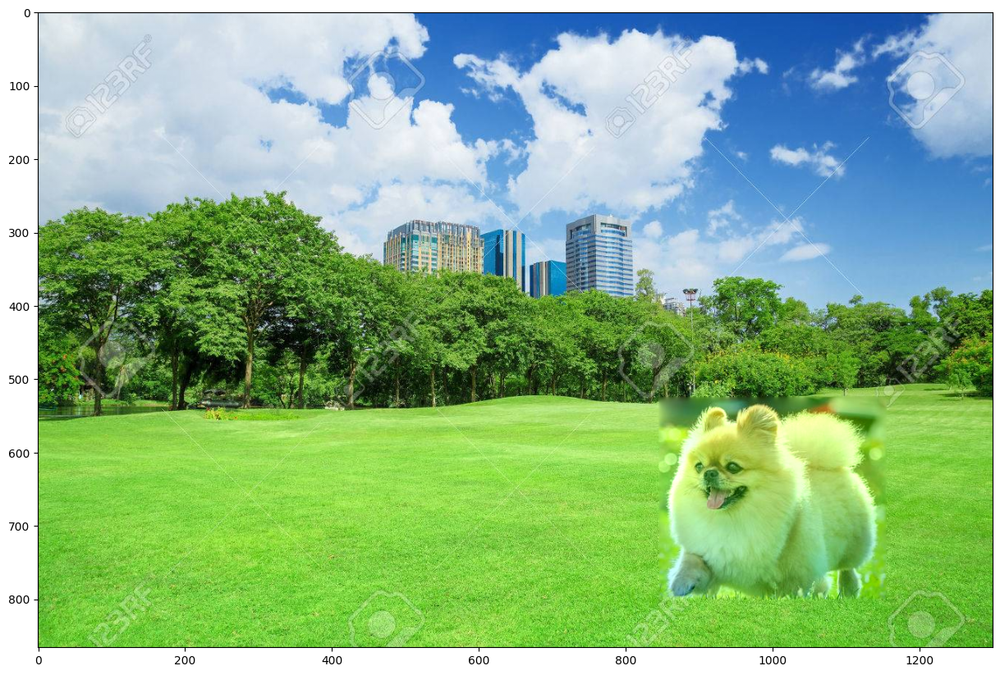

In [157]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

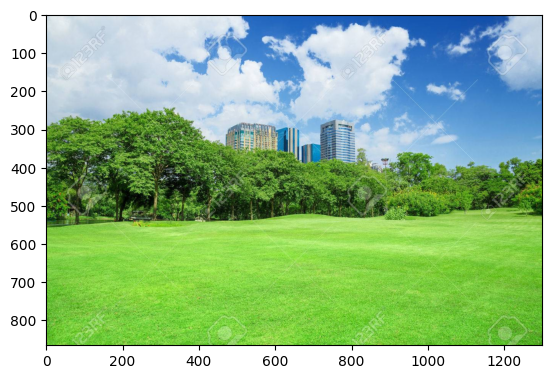

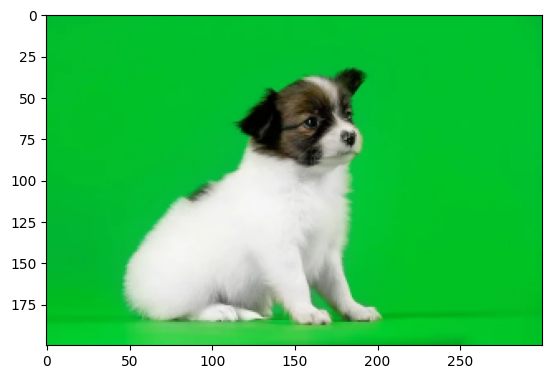

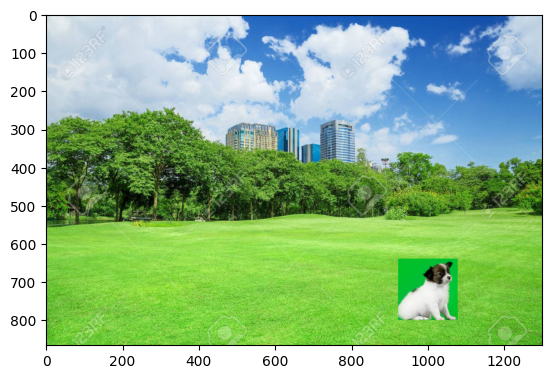

In [158]:
background_img = cv2.cvtColor(cv2.imread('samples/grass.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/dog.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
object_img = cv2.resize(object_img, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)

plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (50, 205, 205, 50)
  ys = (25, 25, 185, 185)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (1000, 800) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.4090127492766633].


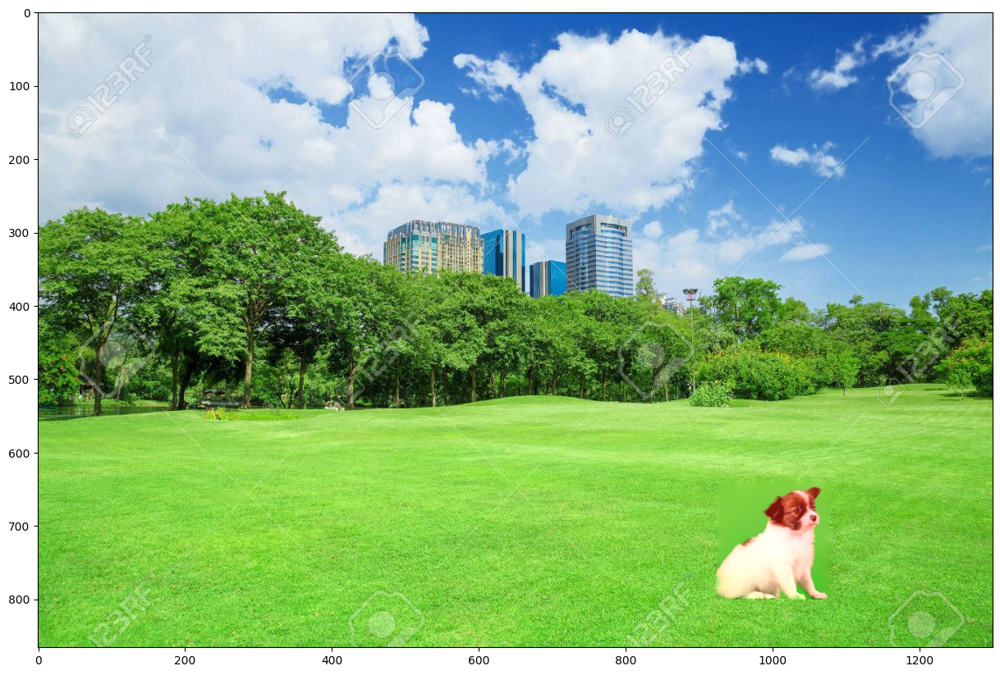

In [159]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

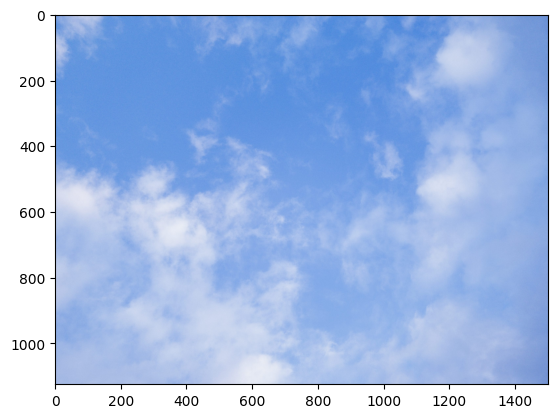

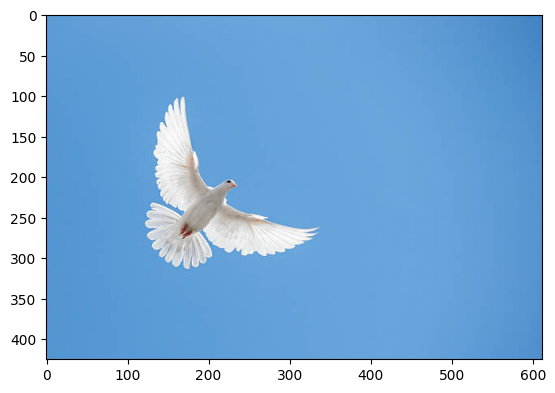

[649, 1074]


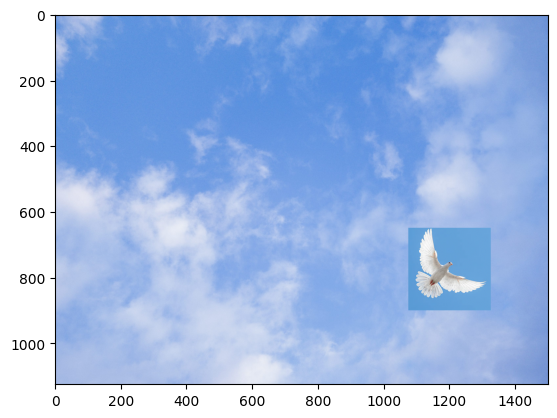

In [251]:
background_img = cv2.cvtColor(cv2.imread('samples/sky.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
background_img = cv2.resize(background_img, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)

plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/bird.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
# object_img = cv2.resize(object_img, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)

plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (100, 350, 350, 100)
  ys = (100, 100, 350, 350)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (1200, 900) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06140706769767283..1.2737862106844073].


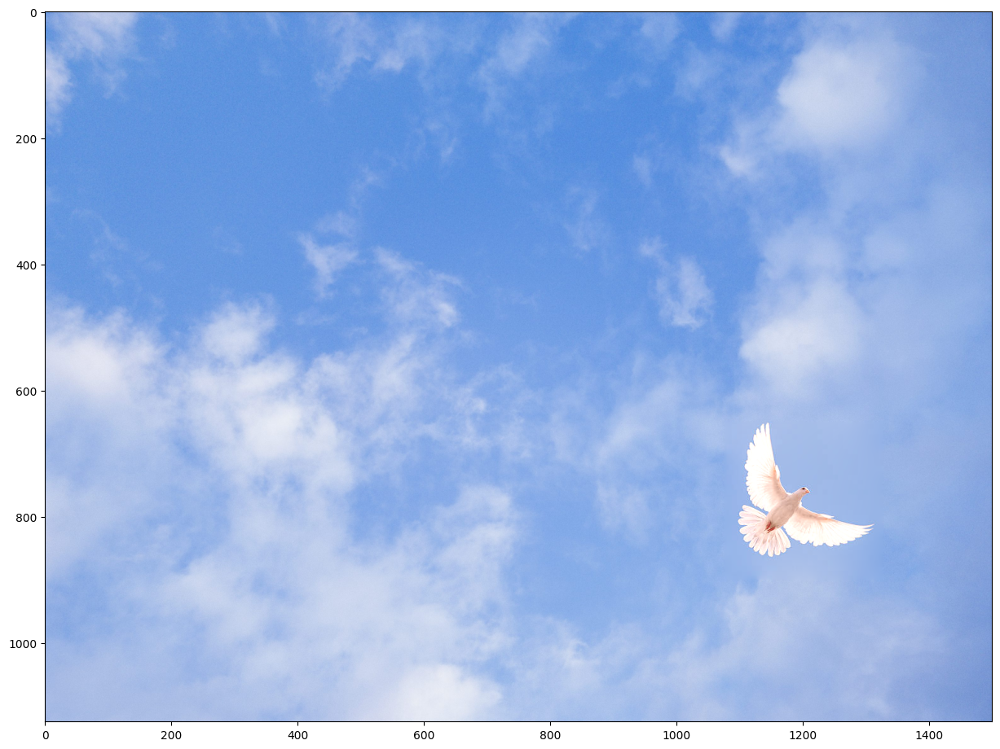

In [ ]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

## Part 3 Mixed Gradients (20 pts)

In [ ]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    #TO DO 
    im_h, im_w = object_img.shape
    bg_h, bg_w = bg_img.shape
    result = bg_img.copy()


    num_pixels = im_h * im_w
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    A = scipy.sparse.lil_matrix((num_pixels*4, num_pixels), dtype='double')
    b = np.zeros((num_pixels*4, 1), dtype='double')
    e = 0
    bg_patch = bg_img[bg_ul[0]: bg_ul[0]+im_h, bg_ul[1]: bg_ul[1]+im_w]
    # mixed_grad_x, mixed_grad_y=mixed_gradients(object_img, bg_patch)
    # plt.figure(figsize=(15,15))
    # plt.imshow(mixed_grad_x)
    for x in range(im_w):
        for y in range(im_h):
            # Ensure we stay within bounds when accessing neighboring pixels
            if x < im_w - 1:  # x+1 boundary check
                A[e, im2var[y, x]] = 1
                A[e, im2var[y, x+1]] = -1
                grad_obj = object_img[y,x] - object_img[y,x+1]
                grad_bg = bg_patch[y,x] - bg_patch[y,x+1]
                b[e] = grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg
                e += 1
            # if x > 0:  # x-1 boundary check
            #     A[e, im2var[y, x]] = 1
            #     A[e, im2var[y, x-1]] = -1
            #     # b[e] = mixed_grad_x[y, x-1]

            #     grad_obj = object_img[y,x] - object_img[y,x-1]
            #     grad_bg = bg_patch[y,x] - bg_patch[y,x-1]
            #     b[e] = grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg
            #     e += 1

            if y < im_h - 1:  # y+1 boundary check
                A[e, im2var[y, x]] = 1
                A[e, im2var[y+1, x]] = -1
                # b[e] = mixed_grad_y[y, x]
                grad_obj = object_img[y,x] - object_img[y+1,x]
                grad_bg = bg_patch[y,x] - bg_patch[y+1,x]
                b[e] = grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg
                e += 1

            # if y > 0:  # y-1 boundary check
            #     A[e, im2var[y, x]] = 1
            #     A[e, im2var[y-1, x]] = -1
            #     # b[e] = mixed_grad_y[y-1, x]
            #     grad_obj = object_img[y,x] - object_img[y-1, x]
            #     grad_bg = bg_patch[y,x] - bg_patch[y-1, x]
            #     b[e] = grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg
            #     e += 1
            
            if (x == 0):
                A[e, im2var[y, x+1]] = 1
                # b[e] = mixed_grad_x[y, x] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                grad_obj = object_img[y,x+1] - object_img[y,x]
                grad_bg = bg_patch[y,x+1] - bg_patch[y,x]
                b[e] = (grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg) + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1

            if (x == im_w-1):
                A[e, im2var[y, x-1]] = 1
                # b[e] = mixed_grad_x[y, x-1] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                grad_obj = object_img[y,x-1] - object_img[y,x]
                grad_bg = bg_patch[y,x-1] - bg_patch[y,x]
                b[e] = (grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg)+ bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1


            if (y == 0):
                A[e, im2var[y+1, x]] = 1
                # b[e] = mixed_grad_y[y, x] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                grad_obj = object_img[y+1,x] - object_img[y,x]
                grad_bg = bg_patch[y+1,x] - bg_patch[y,x]
                b[e] = (grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg)  + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1

            if (y == im_h-1):
                A[e, im2var[y-1, x]] = 1
                # b[e] = mixed_grad_y[y-1, x] + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                grad_obj = object_img[y-1,x] - object_img[y,x]
                grad_bg = bg_patch[y-1,x] - bg_patch[y,x]
                b[e] = (grad_obj if np.abs(grad_obj) > np.abs(grad_bg) else grad_bg) + bg_img[bg_ul[0] + y, bg_ul[1] + x]
                e += 1

    A = A.tocsr()
    v = scipy.sparse.linalg.lsqr(A, b)[0]
    new_object_img = v.reshape(im_h, im_w)
    print(new_object_img.shape, bg_img.shape, object_mask.shape)
    
    result[bg_ul[0]:bg_ul[0]+im_h, bg_ul[1]:bg_ul[1]+im_w] =  (object_mask)*new_object_img + (1-object_mask)*bg_img[bg_ul[0]:bg_ul[0]+im_h, bg_ul[1]:bg_ul[1]+im_w] 
    # result  + (1-object_mask)*new_object_img
    # print(result.shape)
    return result

(253, 253) (1125, 1500) (253, 253)
(253, 253) (1125, 1500) (253, 253)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07160058604648376..1.334699017210766].


(253, 253) (1125, 1500) (253, 253)


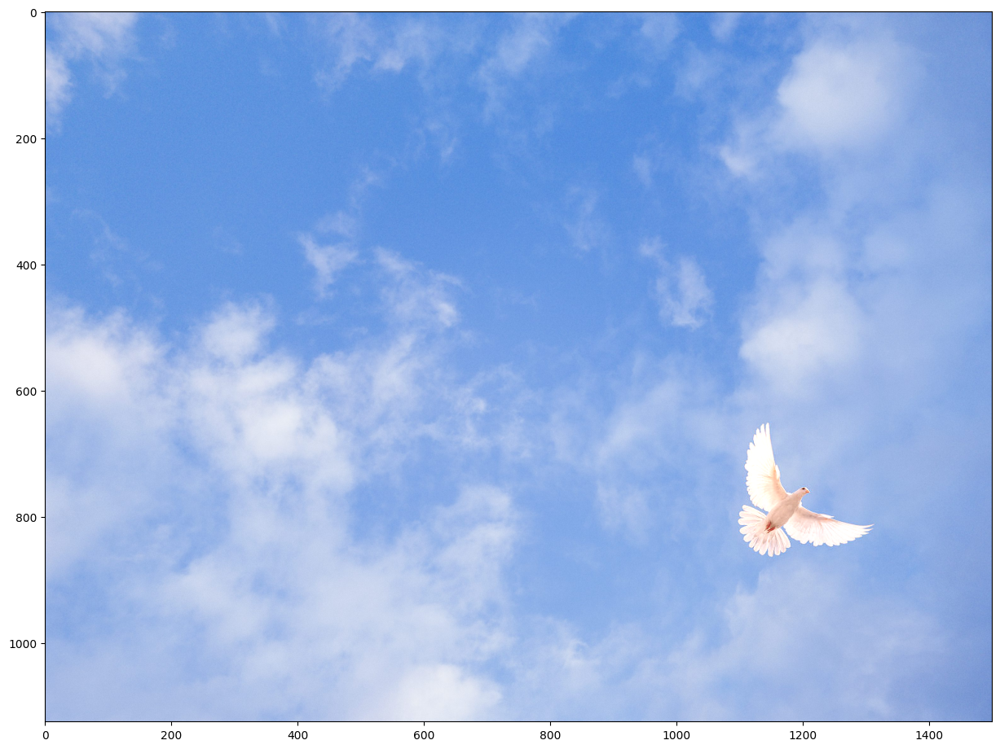

In [ ]:
im_mix = np.zeros(background_img.shape)
for b in np.arange(3):
  im_mix[:,:,b] = mixed_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_mix)

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

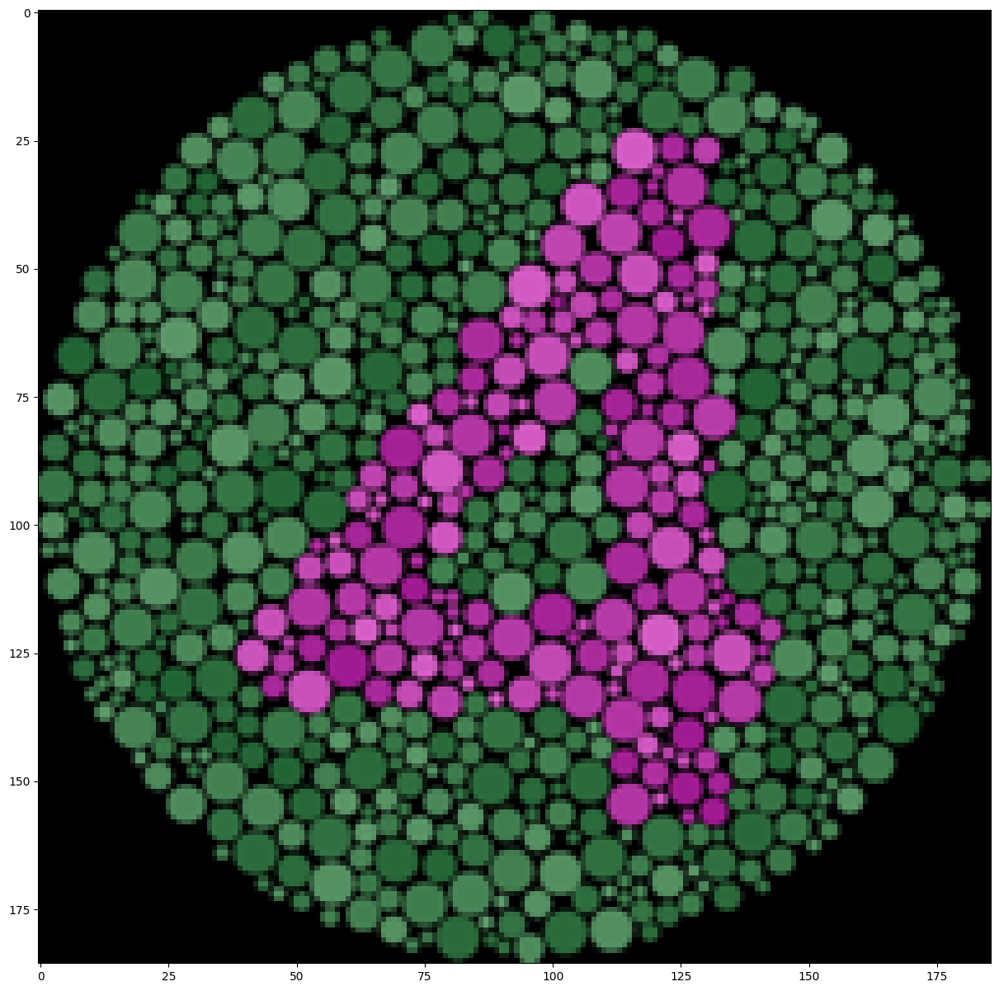

In [124]:
# color = cv2.imread('./samples/colorBlind4.png')
sample_img_fn = './samples/colorBlind4.png'
color = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
# img = 0.299 * color[:,:,0] + 0.587 * color[:,:,1]  + 0.114 * color[:,:,2]
# gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(15,15))
plt.imshow(color)

In [125]:
def create_object_mask(shape, border=1):
    mask = np.ones(shape, dtype=np.uint8)  # Initialize with ones
    mask[:border, :] = 0  # Top border
    mask[-border:, :] = 0  # Bottom border
    mask[:, :border] = 0  # Left border
    mask[:, -border:] = 0  # Right border
    return mask

In [ ]:
import numpy as np
import scipy.sparse
import scipy.sparse.linalg

def color2gray(img):
    """
    Converts an RGB image to grayscale while preserving gradients.

    Args:
        img: A numpy array of shape (height, width, 3) representing the RGB image.

    Returns:
        A numpy array of shape (height, width) representing the grayscale image.
    """
    # g = (0.2125 * img[:, :, 0] + 0.7154 * img[:, :, 1] + 0.0721 * img[:, :, 2]).astype(np.float64)
    img_h, img_w, _ = img.shape

    im2var = np.arange(img_h * img_w).reshape(img_h, img_w)
    v_dimension = img_h * img_w

    A = scipy.sparse.lil_matrix((v_dimension * 3, v_dimension), dtype=np.float64)  
    b = np.zeros(v_dimension * 3)
    e = 0

    for y in range(img_h):
        for x in range(img_w):
            if x + 1 < img_w:
                gx_r = img[y, x+1, 0] - img[y, x, 0]
                gx_g = img[y, x+1, 1] - img[y, x, 1]
                gx_b = img[y, x+1, 2] - img[y, x, 2]
                gx_max = np.max(np.abs([gx_r, gx_g, gx_b]))
                gx = gx_r if abs(gx_r) == gx_max else (gx_g if abs(gx_g) == gx_max else gx_b)

                A[e, im2var[y, x + 1]] = 1
                A[e, im2var[y, x]] = -1
                b[e] = gx
                e += 1
                
            if y + 1 < img_h:
                gy_r = img[y+1, x, 0] - img[y, x, 0]
                gy_g = img[y+1, x, 1] - img[y, x, 1]
                gy_b = img[y+1, x, 2] - img[y, x, 2]
                gy_max = np.max(np.abs([gy_r, gy_g, gy_b]))
                gy = gy_r if abs(gy_r) == gy_max else (gy_g if abs(gy_g) == gy_max else gy_b)

                A[e, im2var[y + 1, x]] = 1
                A[e, im2var[y, x]] = -1
                b[e] = gy
                e += 1

    A[e, im2var[0, 0]] = 1
    b[e] = g[0, 0]
    e += 1

    v = scipy.sparse.linalg.lsqr(A.tocsr(), b)[0].reshape(img_h, img_w)
    v_min = np.min(v)
    v_max = np.max(v)
    
    if v_max - v_min == 0:
        normalized_v = np.zeros_like(v, dtype=np.uint8)
    else:
        normalized_v = ((v - v_min) / (v_max - v_min) * 255)

    return np.clip(normalized_v, 0, 255).astype(np.uint8)

In [127]:
color = cv2.imread('./samples/colorBlind4.png')
color = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB).astype("double")
result= color2gray(color)
    

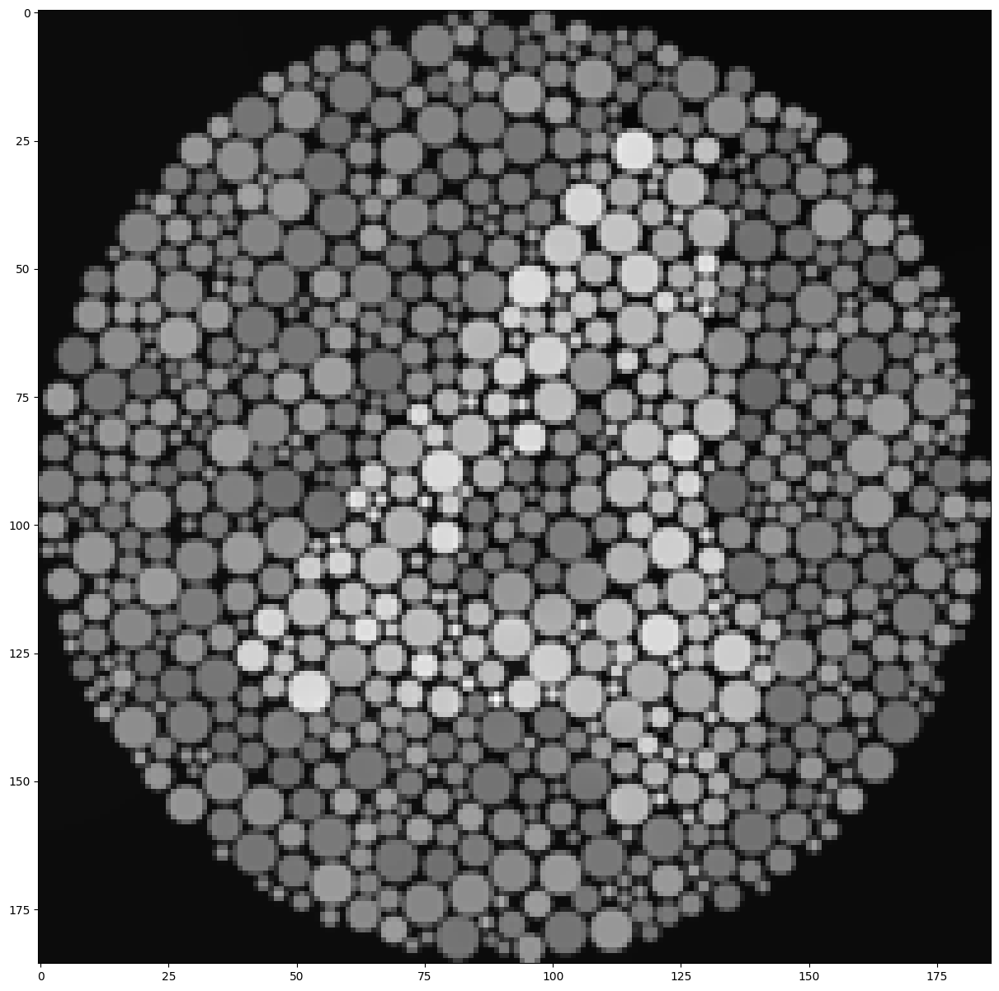

In [181]:
plt.figure(figsize=(15,15))
plt.imshow(result,cmap="gray")

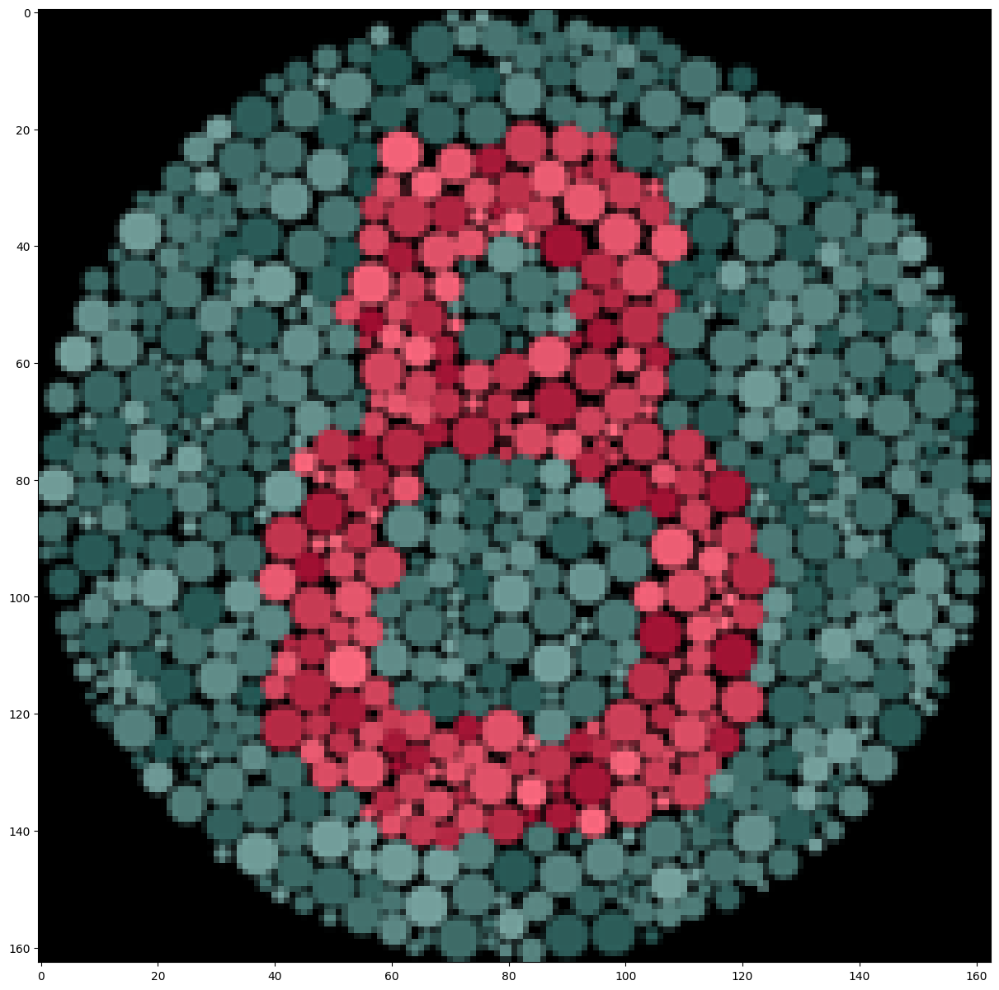

In [189]:
# color = cv2.imread('./samples/colorBlind4.png')
sample_img_fn = './samples/colorBlind8.png'
color = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
# img = 0.299 * color[:,:,0] + 0.587 * color[:,:,1]  + 0.114 * color[:,:,2]
# gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(15,15))
plt.imshow(color)

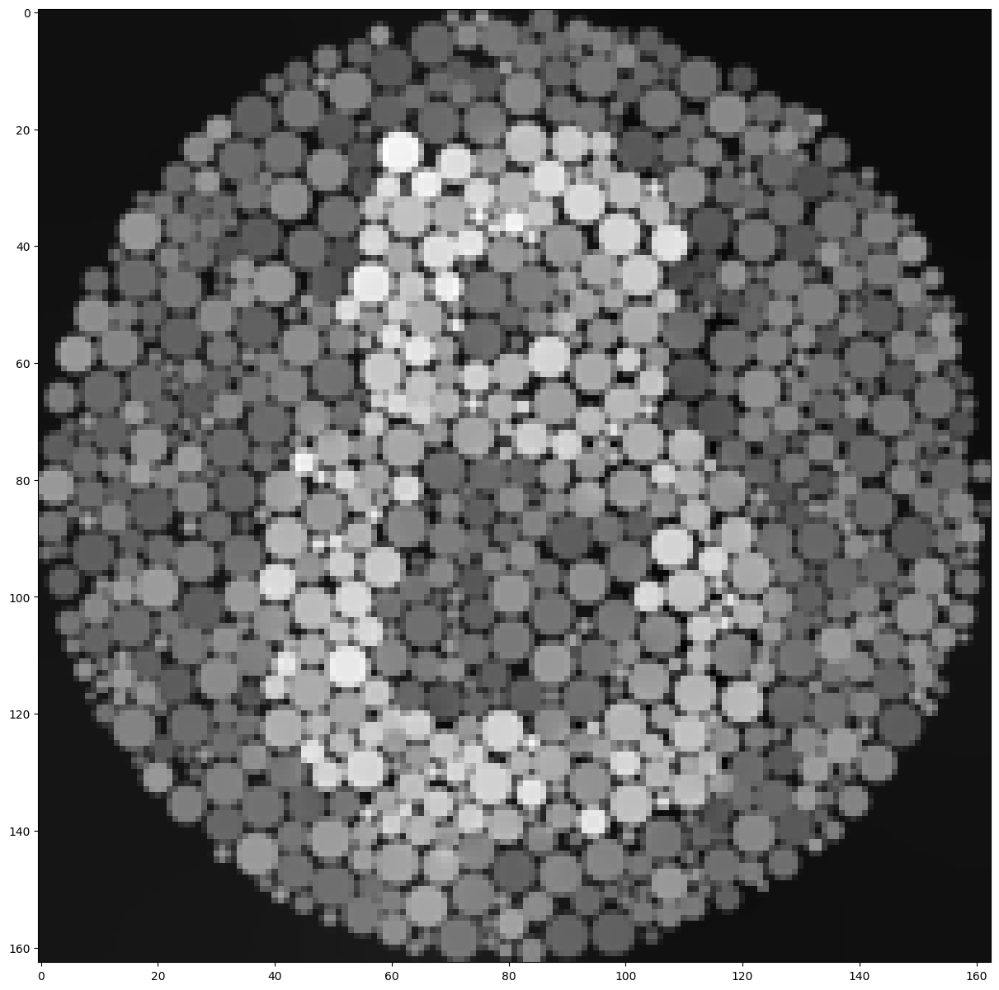

In [ ]:
color = cv2.imread('./samples/colorBlind8.png')
color = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB).astype("double")
result= color2gray(color)
plt.figure(figsize=(15,15))
plt.imshow(result,cmap="gray")

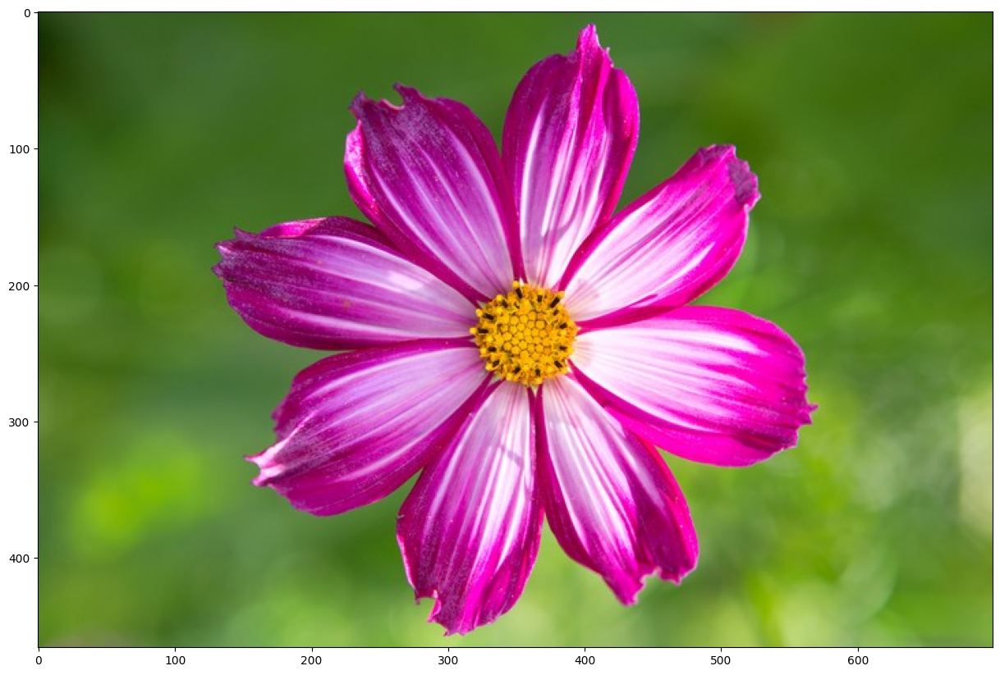

In [229]:
# color = cv2.imread('./samples/colorBlind4.png')
sample_img_fn = './samples/flower.jpg'
color = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
# img = 0.299 * color[:,:,0] + 0.587 * color[:,:,1]  + 0.114 * color[:,:,2]
# gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(15,15))
plt.imshow(color)

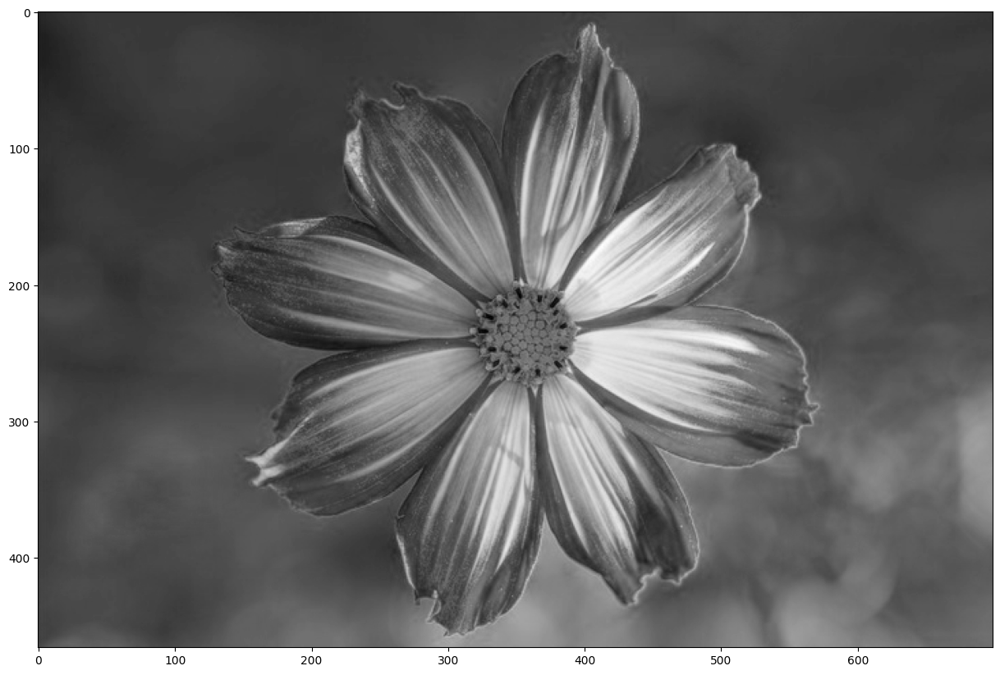

In [231]:
color = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB).astype("double")
result= color2gray(color)
plt.figure(figsize=(15,15))
plt.imshow(result,cmap="gray")

## Laplacian pyramid blending (20 pts)

In [186]:
def laplacian_blend(object_img, object_mask, bg_img, bg_ul):
  # feel free to change input parameters
    pass

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# def build_laplacian_pyramid(img, levels):
#     # Build Gaussian pyramid
#     gaussian_pyramid = [img]
#     for i in range(levels):
#         img = cv2.pyrDown(img)
#         gaussian_pyramid.append(img)
    
#     # Build Laplacian pyramid
#     laplacian_pyramid = []
#     for i in range(levels, 0, -1):
#         gaussian_expanded = cv2.pyrUp(gaussian_pyramid[i], dstsize=(gaussian_pyramid[i-1].shape[1], gaussian_pyramid[i-1].shape[0]))
#         laplacian = cv2.subtract(gaussian_pyramid[i-1], gaussian_expanded)
#         laplacian_pyramid.append(laplacian)
    
#     laplacian_pyramid.append(gaussian_pyramid[-1])  # last Gaussian image is the bottom of the pyramid
#     return laplacian_pyramid

# def blend_pyramids(lap_pyr1, lap_pyr2, alpha_pyr):
#     blended_pyramid = []
#     levels = len(lap_pyr1)
#     for i in range(levels):
#         # Convert alpha to the same type (float32) and ensure it's in the range [0, 1]
#         alpha = alpha_pyr[i].astype(np.float32)
#         alpha = np.clip(alpha, 0.0, 1.0)  # Ensure alpha is within [0, 1]
        
#         # Convert the Laplacian pyramids to float32 to avoid type issues with addWeighted
#         lap_pyr1[i] = lap_pyr1[i].astype(np.float32)
#         lap_pyr2[i] = lap_pyr2[i].astype(np.float32)
        
#         # Perform per-pixel blending
#         blended = (lap_pyr1[i] * (1 - alpha)) + (lap_pyr2[i] * alpha)
#         blended_pyramid.append(blended)

#     return blended_pyramid

# def reconstruct_image_from_pyramid(pyramid):
#     # Start with the smallest image (the last level of the pyramid)
#     img = pyramid[-1]
    
#     # Reconstruct the image by iterating through the pyramid levels in reverse order
#     for i in range(len(pyramid) - 2, -1, -1):
#         # Upscale the image to the size of the next level (which is pyramid[i])
#         img = cv2.pyrUp(img)
        
#         # Resize the upscaled image to the size of the current pyramid level if necessary
#         if img.shape[0] != pyramid[i].shape[0] or img.shape[1] != pyramid[i].shape[1]:
#             img = cv2.resize(img, (pyramid[i].shape[1], pyramid[i].shape[0]))

#         # Add the current level of the pyramid to the upscaled image
#         img = cv2.add(img, pyramid[i])
    
#     return img

# def create_alpha_matte(mask, blur_strength=20):
#     """
#     Convert the binary mask into an alpha matte by applying Gaussian blur.
#     """
#     alpha_matte = mask.astype(np.float32)  # Convert mask to float32 for alpha blending
#     alpha_matte = cv2.GaussianBlur(alpha_matte, (blur_strength, blur_strength), 0)
#     alpha_matte = np.clip(alpha_matte, 0, 1)  # Ensure values are in range [0, 1]
    
#     return alpha_matte

# def laplacian_blend(object_img, object_mask, bg_img, bg_ul, levels=2):
#     """
#     Perform Laplacian pyramid blending of an object onto a background image.
    
#     Parameters:
#     - object_img: The object image to blend (source image).
#     - object_mask: The binary mask of the object (used to create the alpha matte).
#     - bg_img: The background image to place the object on.
#     - bg_ul: The upper-left corner coordinates (x, y) where the object will be placed.
#     - levels: The number of pyramid levels (default is 6).
    
#     Returns:
#     - Blended image with the object placed on the background.
#     """
#     # Resize background to match object size
#     object_h, object_w = object_img.shape[:2]
#     bg_resized = bg_img[bg_ul[1]:bg_ul[1]+object_h, bg_ul[0]:bg_ul[0]+object_w]
#     object_mask = cv2.resize(object_mask, (bg_resized.shape[1], bg_resized.shape[0]))

#     # Resize object to fit the background region
#     object_img = cv2.resize(object_img, (bg_resized.shape[1], bg_resized.shape[0]))

#     # Build Laplacian pyramids for the object and background
#     lap_pyr_obj = build_laplacian_pyramid(object_img, levels)
#     lap_pyr_bg = build_laplacian_pyramid(bg_resized, levels)
    
#     # Create alpha matte (smooth transition from the object mask)
#     alpha = create_alpha_matte(object_mask)
    
#     # Create alpha pyramid (smooth the alpha mask at each pyramid level)
#     alpha_pyr = build_laplacian_pyramid(alpha, levels)
    
#     # Blend the pyramids using the alpha pyramid
#     blended_pyramid = blend_pyramids(lap_pyr_obj, lap_pyr_bg, alpha_pyr)
    
#     # Reconstruct the final blended image
#     blended_img = reconstruct_image_from_pyramid(blended_pyramid)
#     blended_img = np.clip(blended_img, 0, 255).astype(np.uint8)
    
#     return blended_img

# # Example usage:
# object_img = cv2.cvtColor(cv2.imread("./samples/apple.jpg"), cv2.COLOR_BGR2RGB)
# object_mask = np.zeros_like(object_img)  # Create a simple mask for demonstration
# object_mask[:,:object_img.shape[1]//2] = 1  # Simple mask (left half of the object)
# bg_img = cv2.cvtColor(cv2.imread('./samples/orange.jpg'), cv2.COLOR_BGR2RGB)
# bg_ul = (0, 0)  # Upper-left corner coordinates for placing the object

# blended_image = laplacian_blend(object_img, object_mask, bg_img, bg_ul)

# # Display the blended image
# plt.imshow(blended_image)
# plt.axis('off')
# plt.show()


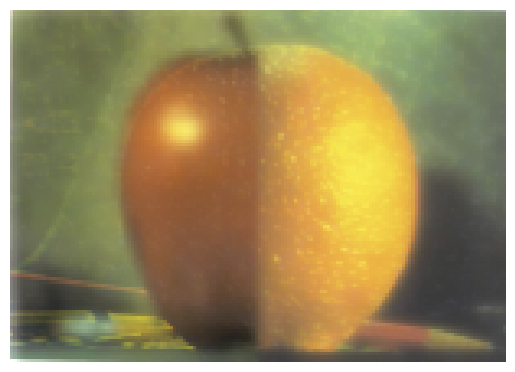

In [240]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def build_laplacian_pyramid(img, levels):
    # Build Gaussian pyramid
    gaussian_pyramid = [img]
    for i in range(levels):
        img = cv2.pyrDown(img)
        gaussian_pyramid.append(img)
    
    # Build Laplacian pyramid
    laplacian_pyramid = []
    for i in range(levels, 0, -1):
        gaussian_expanded = cv2.pyrUp(gaussian_pyramid[i], dstsize=(gaussian_pyramid[i-1].shape[1], gaussian_pyramid[i-1].shape[0]))
        laplacian = cv2.subtract(gaussian_pyramid[i-1], gaussian_expanded)
        laplacian_pyramid.append(laplacian)
    
    laplacian_pyramid.append(gaussian_pyramid[-1])  # last Gaussian image is the bottom of the pyramid
    return laplacian_pyramid

def blend_pyramids(lap_pyr1, lap_pyr2, alpha_pyr):
    blended_pyramid = []
    levels = len(lap_pyr1)
    for i in range(levels):
        # Convert alpha to the same type (float32) and ensure it's in the range [0, 1]
        alpha = alpha_pyr[i].astype(np.float32)
        alpha = np.clip(alpha, 0.0, 1.0)  # Ensure alpha is within [0, 1]
        
        # Convert the Laplacian pyramids to float32 to avoid type issues with addWeighted
        lap_pyr1[i] = lap_pyr1[i].astype(np.float32)
        lap_pyr2[i] = lap_pyr2[i].astype(np.float32)
        
        # Perform per-pixel blending
        blended = (lap_pyr1[i] * (1 - alpha)) + (lap_pyr2[i] * alpha)
        blended_pyramid.append(blended)

    return blended_pyramid

def reconstruct_image_from_pyramid(pyramid, weight_factor=0.9):
    # Start with the smallest image (the last level of the pyramid)
    img = pyramid[-1]
    
    # Reconstruct the image by iterating through the pyramid levels in reverse order
    for i in range(len(pyramid) - 2, -1, -1):
        # Upscale the image to the size of the next level (which is pyramid[i])
        img = cv2.pyrUp(img)
        
        # Resize the upscaled image to the size of the current pyramid level if necessary
        if img.shape[0] != pyramid[i].shape[0] or img.shape[1] != pyramid[i].shape[1]:
            img = cv2.resize(img, (pyramid[i].shape[1], pyramid[i].shape[0]))
        weight = weight_factor ** (len(pyramid) - i - 1)
        
        # Add the current level of the pyramid to the upscaled image with the computed weight
        img = cv2.add(img, pyramid[i] * weight)

    return img

def create_alpha_matte(mask, blur_strength=5):
    """
    Convert the binary mask into an alpha matte by applying Gaussian blur.
    """
    alpha_matte = mask.astype(np.float32)  # Convert mask to float32 for alpha blending
    alpha_matte = cv2.GaussianBlur(alpha_matte, (blur_strength, blur_strength), 1)
    alpha_matte = np.clip(alpha_matte, 0, 1)  # Ensure values are in range [0, 1]
    
    return alpha_matte

def laplacian_blend(object_img, object_mask, bg_img, bg_ul, levels=3):
    """
    Perform Laplacian pyramid blending of an object onto a background image.
    
    Parameters:
    - object_img: The object image to blend (source image).
    - object_mask: The binary mask of the object (used to create the alpha matte).
    - bg_img: The background image to place the object on.
    - bg_ul: The upper-left corner coordinates (x, y) where the object will be placed.
    - levels: The number of pyramid levels (default is 6).
    
    Returns:
    - Blended image with the object placed on the background.
    """
    # Resize background to match object size
    object_h, object_w = object_img.shape[:2]
    bg_resized = bg_img[bg_ul[1]:bg_ul[1]+object_h, bg_ul[0]:bg_ul[0]+object_w]
    object_mask = cv2.resize(object_mask, (bg_resized.shape[1], bg_resized.shape[0]))

    # Resize object to fit the background region
    object_img = cv2.resize(object_img, (bg_resized.shape[1], bg_resized.shape[0]))

    # Build Laplacian pyramids for the object and background
    lap_pyr_obj = build_laplacian_pyramid(object_img, levels)
    lap_pyr_bg = build_laplacian_pyramid(bg_resized, levels)
    
    # Create alpha matte (smooth transition from the object mask)
    alpha = create_alpha_matte(object_mask)
    
    # Create alpha pyramid (smooth the alpha mask at each pyramid level)
    alpha_pyr = build_laplacian_pyramid(alpha, levels)
    
    # Blend the pyramids using the alpha pyramid
    blended_pyramid = blend_pyramids(lap_pyr_obj, lap_pyr_bg, alpha_pyr)
    
    # Reconstruct the final blended image
    blended_img = reconstruct_image_from_pyramid(blended_pyramid)
    blended_img = np.clip(blended_img, 0, 255).astype(np.uint8)
    
    return blended_img

# Example usage:
object_img = cv2.cvtColor(cv2.imread("./samples/apple.jpg"), cv2.COLOR_BGR2RGB)
object_mask = np.zeros_like(object_img)  # Create a simple mask for demonstration
object_mask[:,:object_img.shape[1]//2] = 1  # Simple mask (left half of the object)
bg_img = cv2.cvtColor(cv2.imread('./samples/orange.jpg'), cv2.COLOR_BGR2RGB)
bg_ul = (0, 0)  # Upper-left corner coordinates for placing the object

blended_image = laplacian_blend(bg_img, object_mask,object_img, bg_ul)

# Display the blended image
plt.imshow(blended_image)
plt.axis('off')
plt.show()


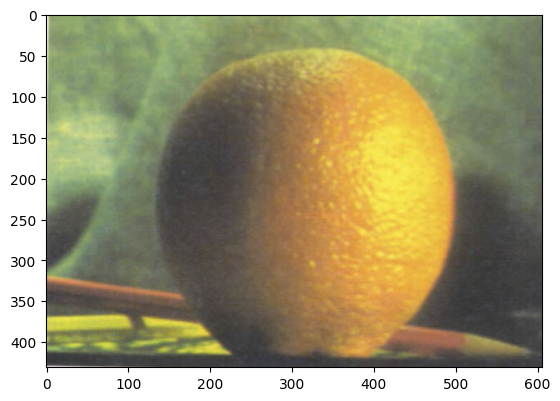

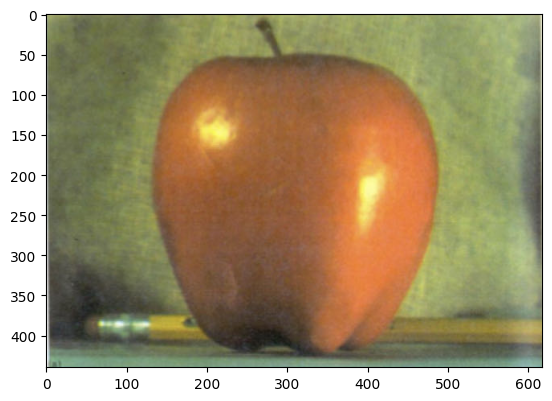

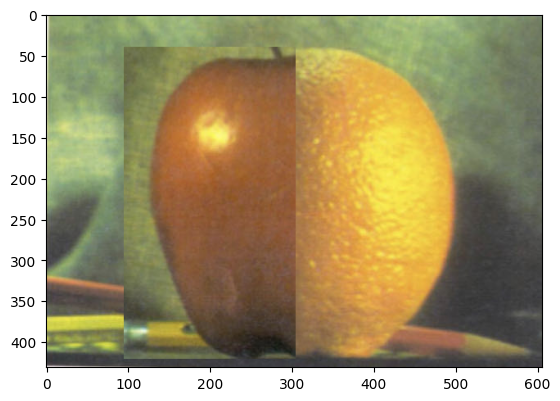

In [319]:
background_img = cv2.cvtColor(cv2.imread('samples/orange.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/apple.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (100, object_img.shape[1]//2, object_img.shape[1]//2, 100)
  ys = (40, 40, 420, 420)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (200,420) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04621394811168345..1.0502607266029673].


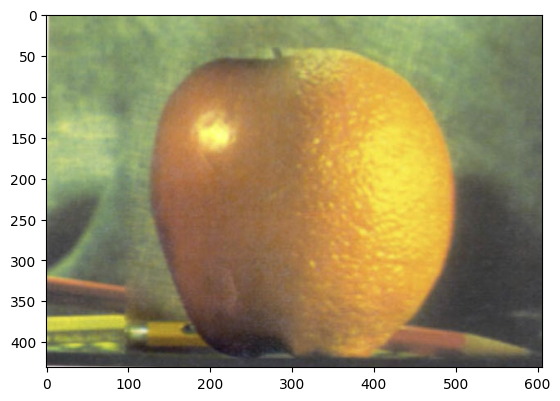

In [320]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.imshow(im_blend)

## More gradient domain processing (up to 20 pts)

(1334, 2000, 3)


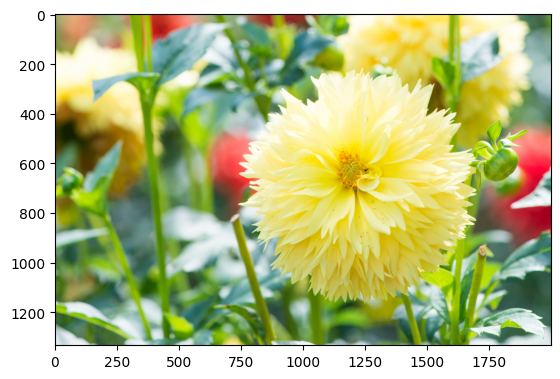

In [183]:
object_img = cv2.cvtColor(cv2.imread('samples/flower2.jpg'), cv2.COLOR_BGR2RGB).astype(np.uint8)/255.0
object_img = cv2.resize(object_img, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)

plt.figure()
plt.imshow(object_img)
print(object_img.shape)
gray_background = (.2989 * object_img[:, :, 0] + .587 * object_img[:, :, 1] + 0.1140 * object_img[:, :, 2]).astype(np.float64)
gray_background =  np.repeat(gray_background[..., np.newaxis], 3, axis=2)


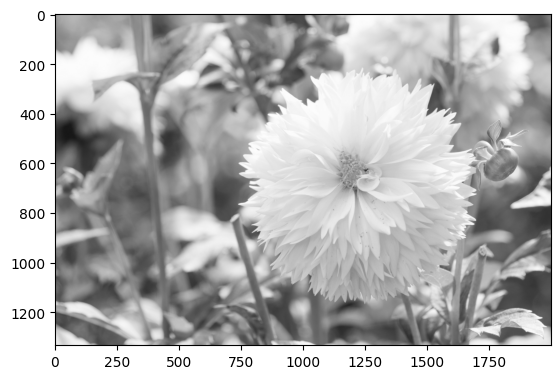

In [184]:
plt.imshow(gray_background)


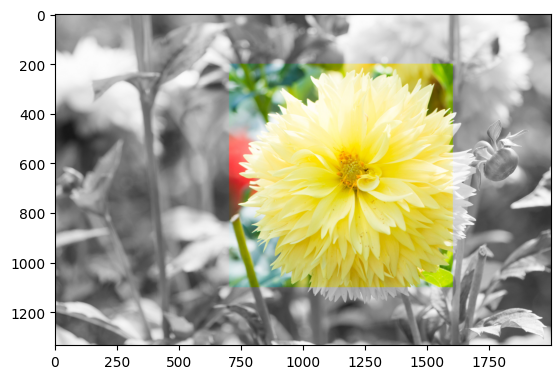

In [185]:


xs = (700, 1600, 1600, 700)
ys = (200, 200, 1100, 1100)
object_mask = utils.get_mask(ys, xs, object_img)
bottom_center = (1150, 1100) # (x,y)

object_img, object_mask = utils.crop_object_img(object_img, object_mask)
bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
plt.imshow(utils.get_combined_img(gray_background, object_img, object_mask, bg_ul))




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.002828711800064168..1.4134814921424468].


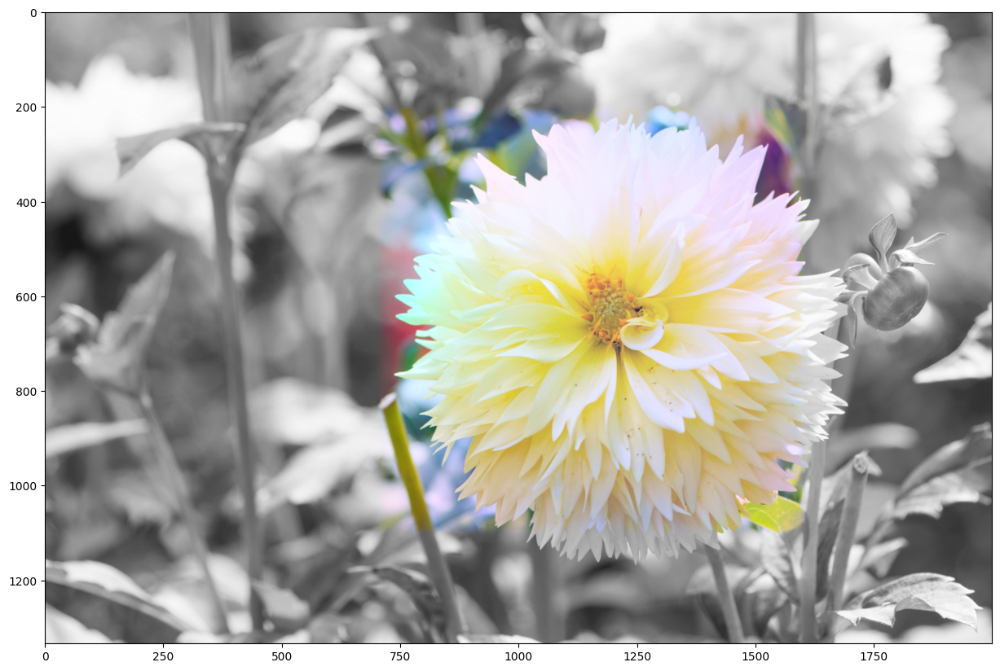

In [186]:
im_blend = np.zeros(gray_background.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, gray_background[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

In [224]:
im_blend_copy = im_blend.copy()
im_blend_copy[:, :, 0] *= 1.5  # Increase red
im_blend_copy[:, :, 1] *= 1 # Reduce green
im_blend_copy[:, :, 2] *= 0.6  # Reduce blue


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0042430677000962515..1.552442773541449].


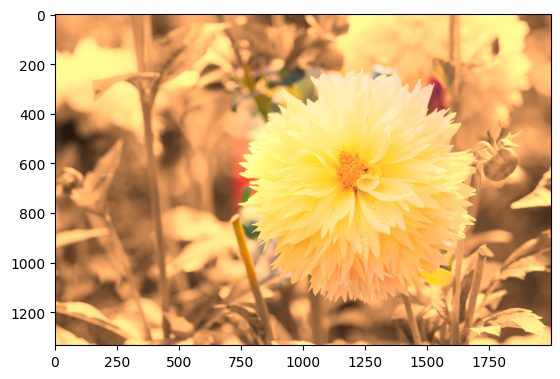

In [225]:
plt.imshow(im_blend_copy)